In [ ]:
# install dependencies
!pip install -U torch torchvision cython
!pip install -U 'git+https://github.com/facebookresearch/fvcore.git' 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
torch.__version__

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-54my8fj5
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-54my8fj5
  Resolved https://github.com/facebookresearch/fvcore.git to commit 51092b5515cbb493f73de079743dd6b11cc4bbf1
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-x1v1ndop
  Running command git clone --filter=blob:none --quiet https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-x1v1ndop
  Resolved https://github.com/cocodataset/cocoapi.git to commit 8c9bcc3cf640524c4c20a9c40e89cb6a2f2fa0e9
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.6-py3-none-any.whl size=65405 

'2.0.0+cu117'

In [ ]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

fatal: destination path 'detectron2_repo' already exists and is not an empty directory.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/detectron2_repo
  Preparing metadata (setup.py) ... done
  Using cached pycocotools-2.0.6-cp39-cp39-linux_x86_64.whl
  Using cached fvcore-0.1.5.post20221221-py3-none-any.whl
  Attempting uninstall: fvcore
    Found existing installation: fvcore 0.1.6
    Uninstalling fvcore-0.1.6:
      Successfully uninstalled fvcore-0.1.6
  Attempting uninstall: pycocotools
    Found existing installation: pycocotools 2.0
    Uninstalling pycocotools-2.0:
      Successfully uninstalled pycocotools-2.0
  Attempting uninstall: detectron2
    Found existing installation: detectron2 0.6
    Can't uninstall 'detectron2'. No files were found to uninstall.
  Running setup.py develop for detectron2


In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

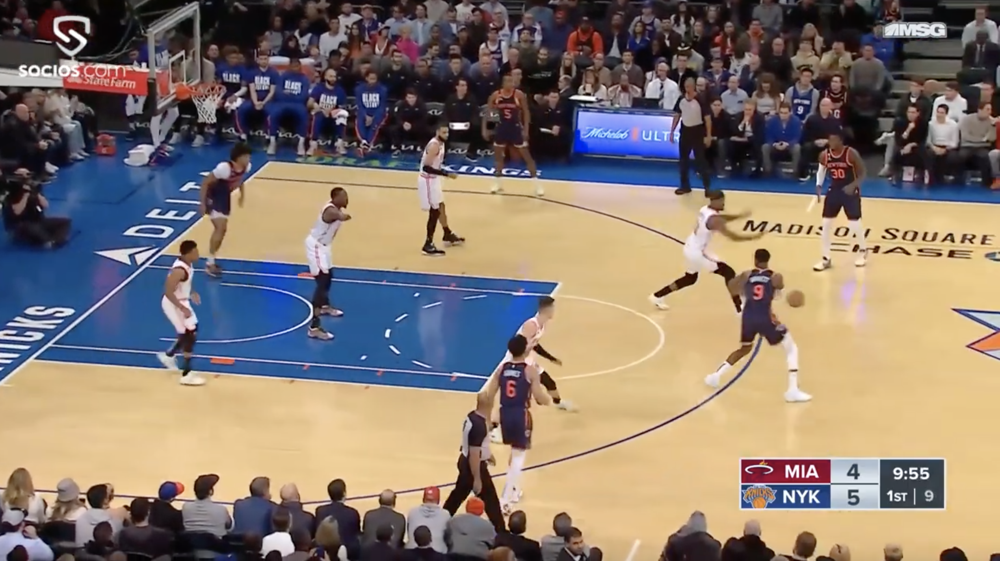

In [ ]:
#!wget https://basketball-ml.s3-eu-west-1.amazonaws.com/3DVideoFrame.jpg -O input.jpg
im = cv2.imread("./3DCourt.jpg")
cv2_imshow(im)

In [ ]:
pip install cuda-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.9/18.9 MB 13.6 MB/s eta 0:00:00


In [ ]:
cfg = get_cfg()

cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"
cfg.MODEL.DEVICE = 'cpu'
predictor = DefaultPredictor(cfg)

players_output = predictor(im)

[03/20 02:57:04 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


model_final_f10217.pkl: 178MB [00:09, 18.6MB/s]                           
/usr/local/lib/python3.9/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [ ]:
instances = players_output["instances"]
print(instances)
pred_boxes = instances.get("pred_boxes")
pred_classes = instances.get("pred_classes")
print(pred_boxes)
print(pred_classes)
     

Instances(num_instances=45, image_height=1426, image_width=2538, fields=[pred_boxes: Boxes(tensor([[1.7849e+03, 6.2592e+02, 2.0564e+03, 1.0226e+03],
        [7.7274e+02, 4.7148e+02, 8.9639e+02, 8.6089e+02],
        [4.0625e+02, 6.0273e+02, 5.3739e+02, 9.7863e+02],
        [1.0583e+03, 3.1374e+02, 1.1836e+03, 6.4464e+02],
        [1.6479e+03, 4.7749e+02, 1.8801e+03, 7.9133e+02],
        [4.9850e+02, 3.5832e+02, 6.4717e+02, 6.9914e+02],
        [2.0580e+03, 3.2409e+02, 2.2060e+03, 6.9062e+02],
        [1.7034e+03, 1.8804e+02, 1.8145e+03, 5.0015e+02],
        [1.2278e+03, 8.3111e+02, 1.4373e+03, 1.3091e+03],
        [1.4118e+03, 1.3313e+03, 1.5331e+03, 1.4258e+03],
        [1.1584e+00, 2.5665e+02, 1.6169e+02, 4.5922e+02],
        [1.2363e+03, 1.7358e+02, 1.3686e+03, 4.5491e+02],
        [4.5545e+02, 1.2031e+03, 5.9448e+02, 1.4222e+03],
        [1.0294e+03, 1.2341e+03, 1.1478e+03, 1.4082e+03],
        [9.1893e+02, 1.2403e+03, 1.0318e+03, 1.3874e+03],
        [7.9337e+02, 1.2188e+03, 9.1584

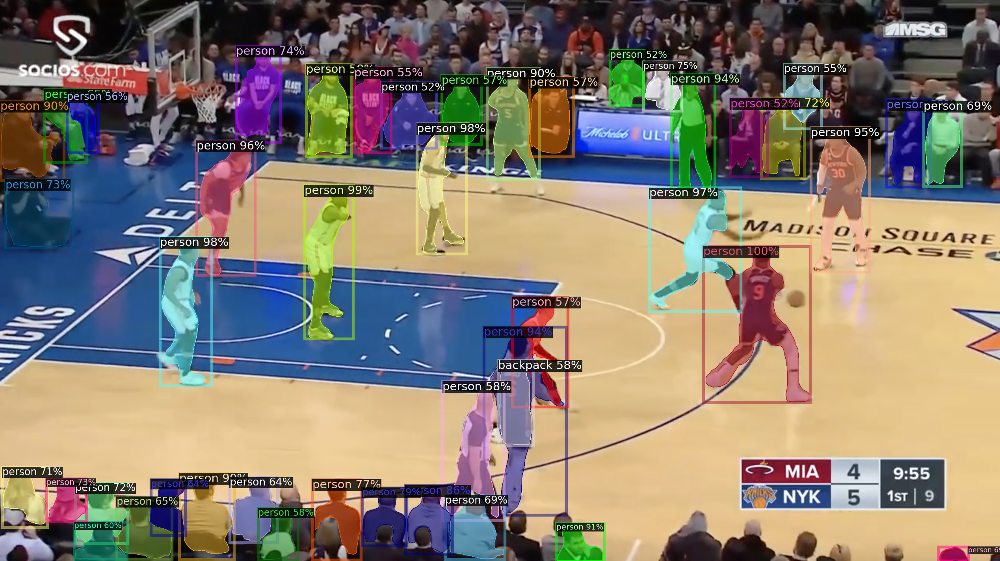

In [ ]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.0)
v = v.draw_instance_predictions(players_output["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

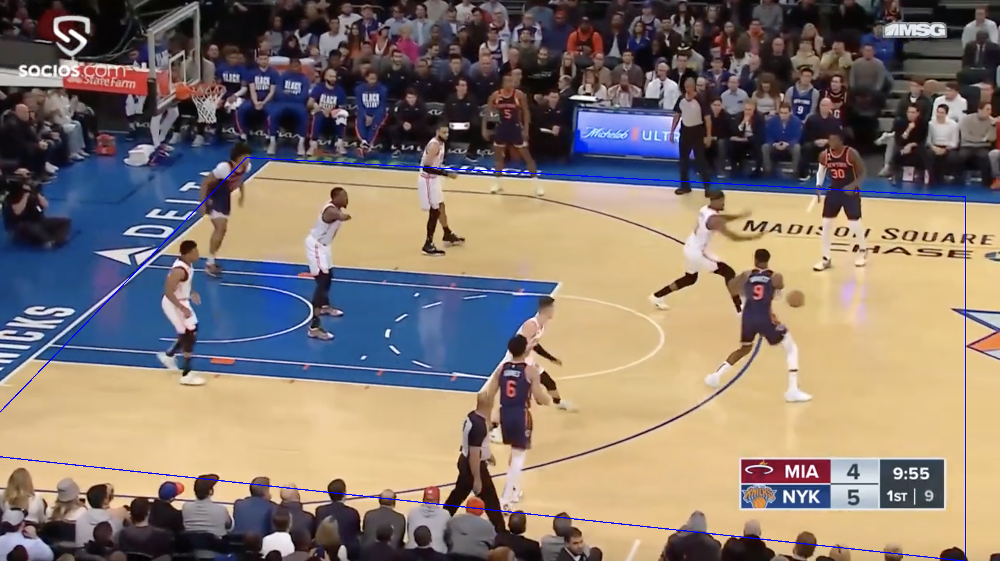

In [ ]:
# Four corners of the 3D court 
# Start top-left corner and go anti-clock wise
src_pts = np.array([
       # [2538,500], #TR
        #[2538,1426], #BR
        #[0,1150], #BL
       #[675,400] #TL

        [0, 1150], #BL
        [2538, 1426], #BR
        [2538, 500], #TR
        [675, 400], #TL
    ])   

im_poly = im.copy()

# cv2.fillPoly(img_src, [src_pts], 255)
cv2.polylines(im_poly, [src_pts], isClosed=True, color=[255,0,0], thickness=2)

cv2_imshow(im_poly)

[ 1920,  1022]
[ 834,  860]
[ 471,  978]
[ 1120,  644]
[ 1763,  791]
[ 572,  699]
[ 2131,  690]
[ 1758,  500]
[ 1302,  454]
[ 1308,  1131]
[ 1370,  1033]


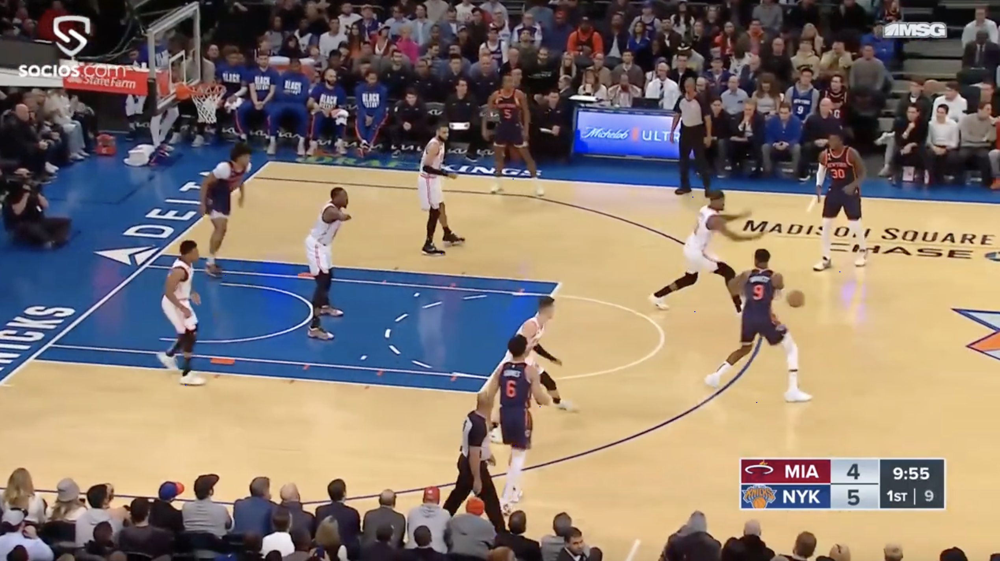

In [ ]:
from shapely.geometry import Point, Polygon

def drawPlayers(im, pred_boxes, showResult=False):
  color = [255, 0, 0]   
  thickness = 1
  radius = 1

  i  = 0
  for box in pred_boxes:
    
    # Include only class Person
    if pred_classes[i] == 0:  
        
      x1 = int(box[0])
      y1 = int(box[1])
      x2 = int(box[2])
      y2 = int(box[3])

      xc = x1 + int((x2 - x1)/2)
      player_pos1 = (xc - 1, y2)
      player_pos2 = (xc + 1, y2 + 1)

      court = Polygon(src_pts)

      # Draw only players that are within the basketball court
      if Point(player_pos1).within(court):
        if showResult:
          print("[% 3d, % 3d]" %(xc, y2))

        cv2.rectangle(im, player_pos1, player_pos2, color, thickness)
        i = i + 1            

  if showResult:
    cv2_imshow(im)


drawPlayers(im, pred_boxes, True)

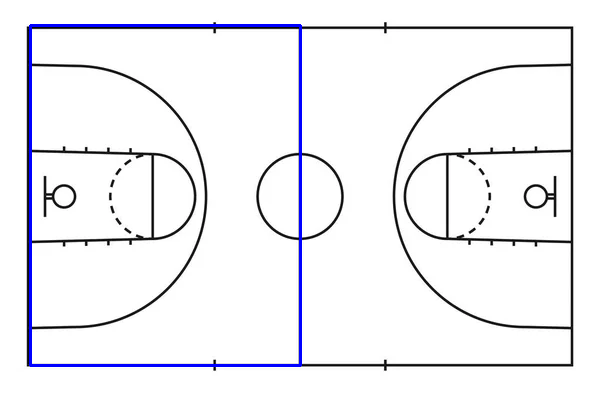

In [ ]:
img_dst = cv2.imread('./2DCourt.jpg')

dst_leftpts= np.array([
      [30,365],  # LEFT BOTTOM
      [300,365],  # RIGHT BOTTOM
      [300,  25],   # TOP RIGHT  (4 o'clock)
      [30,  25]# TOP LEFT (7 o'clock)
    ]) 
cv2.polylines(img_dst, [dst_leftpts], isClosed=True, color=[255,0,0], thickness=2)
cv2_imshow(img_dst)

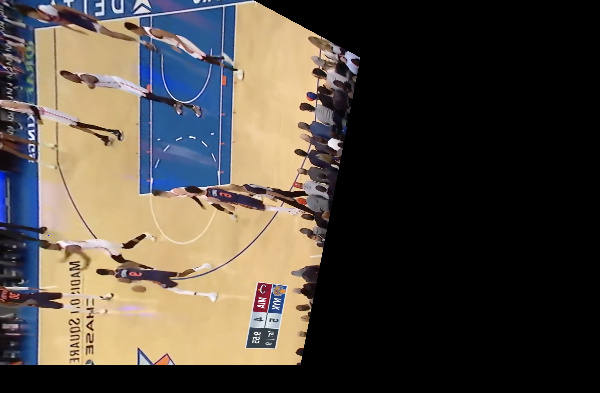

In [ ]:
def homographyTransform(im, showResult=False):

  # Calculate Homography
  h, status = cv2.findHomography(src_pts, dst_leftpts)
  img_out = cv2.warpPerspective(im, h, (img_dst.shape[1], img_dst.shape[0]))
  
  if showResult:
    cv2_imshow(img_out)

  return img_out  

# Try out
img_out = homographyTransform(im, True)  

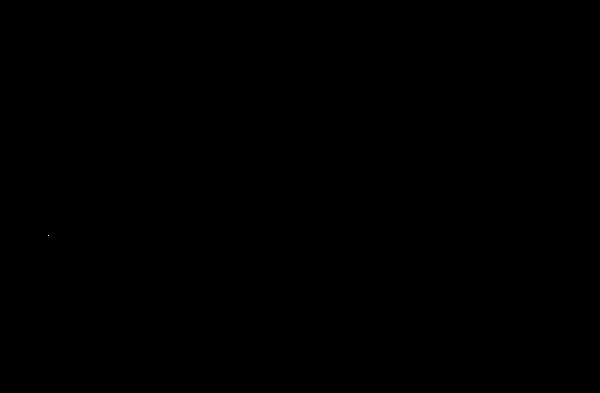

In [ ]:
def getPlayersMask(im):
  lower_range = np.array([255,0,0])                         # Set the Lower range value of blue in BGR
  upper_range = np.array([255,155,155])                     # Set the Upper range value of blue in BGR
  mask = cv2.inRange(im, lower_range, upper_range)     # Create a mask with range
  result = cv2.bitwise_and(im, img_out, mask = mask)   # Performing bitwise and operation with mask in img variable
  # cv2_imshow(result)                              

  return cv2.inRange(result, lower_range, upper_range)  
  
# Try out  
mask = getPlayersMask(img_out)    
cv2_imshow(mask)

In [ ]:
def drawPlayersOnCourt(im, coord, color, radius=10):
  for pos in coord:
    center_coordinates = (pos[0], pos[1])
    cv2.circle(im, center_coordinates, radius, color, thickness=-1) 

  return im
     

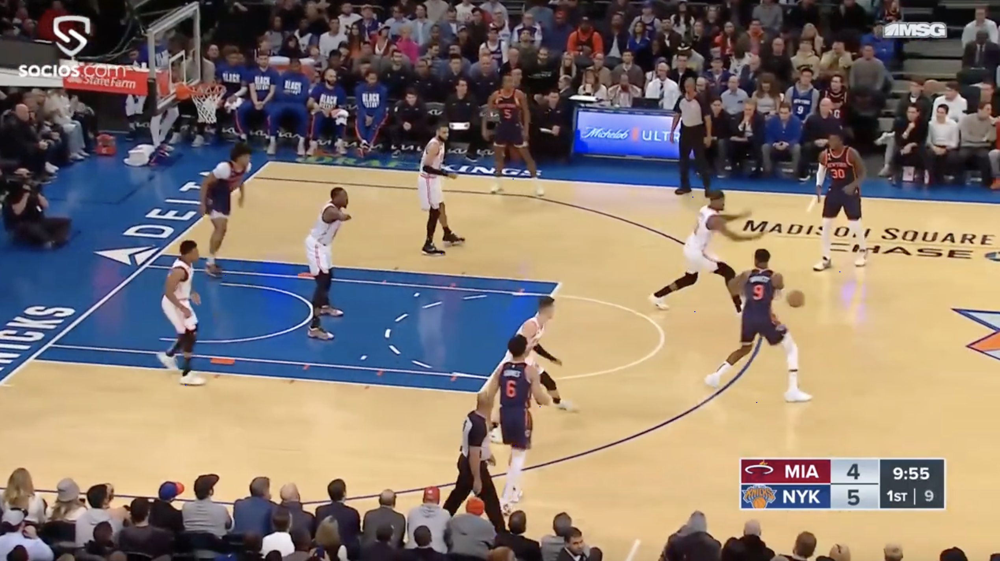

In [ ]:
cv2_imshow(im)

In [ ]:
!wget https://s3.console.aws.amazon.com/s3/object/thesishomography?region=us-east-2&prefix=Clip1.mp4

--2023-03-20 02:58:44--  https://s3.console.aws.amazon.com/s3/object/thesishomography?region=us-east-2
Resolving s3.console.aws.amazon.com (s3.console.aws.amazon.com)... 99.83.255.39, 75.2.51.23
Connecting to s3.console.aws.amazon.com (s3.console.aws.amazon.com)|99.83.255.39|:443... connected.
HTTP request sent, awaiting response... 200 
Length: 1023 [text/html]
Saving to: ‘thesishomography?region=us-east-2’

thesishomography?re 100%[===================>]    1023  --.-KB/s    in 0s      

2023-03-20 02:58:44 (108 MB/s) - ‘thesishomography?region=us-east-2’ saved [1023/1023]



In [ ]:
def drawCoordinateLines(result, pts, currentFrame, player):
  
  for i in np.arange(1, len(pts)):
    
    # if either of the tracked points are None, ignore them
    if pts[i - 1] is None or pts[i] is None:
      continue

    thickness = int(np.sqrt(30 / float(i + 1)) * 2.5)
    print("player=%s" %player)
    x1 = pts[i - 1][0][0]
    x2 = pts[i - 1][0][1]
    print("x1=%d, x2=%d" %(x1, x2))
    y1 = pts[i][0][0]
    y2 = pts[i][0][1]
    print("y1=%d, y2=%d" %(y1, y2))
    print(" ---------------------- ")
    cv2.line(result, (x1, x2), (y1, y2), red_color, thickness)

  return result

In [ ]:
import time
import progressbar
from time import sleep
from collections import deque
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import GenericMask
import imutils

vs = cv2.VideoCapture("./Clip1Redo.mp4")
totalFrames = int(vs.get(cv2.CAP_PROP_FRAME_COUNT))

grabbed = True
currentFrame = 0
start = time.time()
writer = None

bar = progressbar.ProgressBar(maxval=totalFrames, \
      widgets=[progressbar.Bar('=', '[', ']'), ' ', progressbar.Percentage()])

bar.start()

court_img = cv2.imread('./2DCourt.jpg')

blue_color = (255,0,0)
red_color = (0,0,255)

# loop over frames from the video file stream (207)
while grabbed:     
  
  # read the next frame from the file
  (grabbed, frame) = vs.read()

  if writer is None:
    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    writer = cv2.VideoWriter("mini-map-output.mp4", fourcc, 24, (court_img.shape[1], court_img.shape[0]), True)

  if grabbed: # print(currentFrame)
  
    # Get player positions
    outputs = predictor(frame)  
    instances = outputs["instances"].to("cpu")
    boxes = instances.get("pred_boxes")

    court = court_img.copy()

    # Draw players on video frame
    drawPlayers(frame, boxes, False)
    
    img_out = homographyTransform(frame, False)
    # cv2_imshow(img_out)

    mask = getPlayersMask(img_out)
    
    # cv2_imshow(mask)

    # Get the contours from the players "dots" so we can reduce the coordinates
    # to the number of players on the court.
    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = imutils.grab_contours(cnts)
  
    if cnts is not None:      
      for cnt in cnts:
        result = drawPlayersOnCourt(court, cnt[0], blue_color)
                               
    writer.write(result)

    currentFrame += 1
    bar.update(currentFrame)
  
  else:
      grabbed = False

# cv2_imshow(result)
    
writer.release()
vs.release()
bar.finish()

end = time.time()
elap = (end - start)
print("[INFO] process took {:.4f} seconds".format(elap))

print("Video created")

[========================================================================] 100%


[INFO] process took 1266.4126 seconds
Video created
